In [1]:
using Arpack
using LinearAlgebra
using CairoMakie
using LaTeXStrings
using Statistics
include("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/concentrated_new/lattice_BZ.jl")
include("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/bc_sign_flip/patch_methods.jl")
include("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/bc_sign_flip/dirac_spinors.jl")
include("/Users/avadali/Desktop/Desktop - Avi's Mac/Summer2024/concentrated_new/concentrated_BC.jl")

state_coefficients (generic function with 1 method)

In [2]:
# general parameters
pd = 80
kappa = 1
w = 10^(-2) * kappa
spacing = 0.5 * (w / 2 / pd)

2.5000000000000008e-5

In [3]:
# Dirac parameters
m = -1
v = 0.5
index = 1

1

In [4]:
# 3-patch parametersa
alpha = 1im
delta = -1
vF = 0

0

In [5]:
function dirac_bc_comparison(pd, w, spacing, v, m, index, kappa, vF, delta, alpha)

    grid_sor = make_hex([0, 0], w / 2, w / 2 / pd)

    grid_patch = make_hex([0, 0], w / 2, w / 2 / pd)

    sor_bc = dirac_spinor_bc(grid_sor, spacing, v, m, index)
    patch_bc = dirac_patch_bc(grid_patch, spacing, v, m, index, kappa, vF, delta, alpha)

    fig = Figure(size=(2000, 800), fontsize=25)

    ax1 = Axis(fig[1, 1], title = L"\text{3-Patch } \Omega (\textbf{k})", xlabel = L"k_x", ylabel = L"k_y")
    tricontourf!(ax1, grid_patch[:, 1], grid_patch[:, 2], patch_bc, colormap = :Spectral)
    X, ax1, tr1 = tricontourf(grid_patch[:, 1], grid_patch[:, 2], patch_bc, colormap = :Spectral)
    cb1 = Colorbar(fig[1, 2], tr1)

    ax3 = Axis(fig[1, 3], title = L"\text{Spinor } \Omega (\textbf{k}) \text{ @ } \kappa", xlabel = L"k_x", ylabel = L"k_y")
    tricontourf!(ax3, grid_sor[:, 1], grid_sor[:, 2], sor_bc, colormap = :Spectral)
    X, ax3, tr3 = tricontourf(grid_sor[:, 1], grid_sor[:, 2], sor_bc, colormap = :Spectral)
    cb3 = Colorbar(fig[1, 4], tr3)

    fig
end

dirac_bc_comparison (generic function with 1 method)

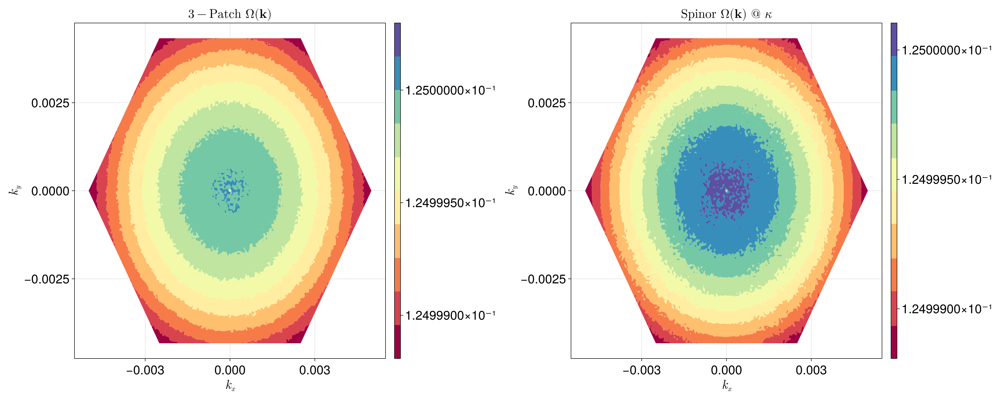

In [6]:
dirac_bc_comparison(pd, w, spacing, v, m, index, kappa, vF, delta, alpha)

In [7]:
function dirac_bc_contour_series(v, m, l, kappa, vF, delta, alpha_list, w, pd)
    grid = make_hex([0, 0], w / 2, w / 2 / pd)
    spacing = 0.5 * (w / 2 / pd)
    # create plot
    d1 = length(alpha_list)
    if d1 > 1
        fig = Figure(size=(1700, 300 * d1), fontsize=30)
    else
        fig = Figure(size=(1000, 800), fontsize=30)
    end
    index = 1
    for j in 1:d1
        alpha = alpha_list[j]
        curvatures = dirac_patch_bc(grid, spacing, v, m, l, kappa, vF, delta, alpha)

        id1 = index % 4
        ax1 = Axis(fig[Int(floor((j - 1) / 2)) + 1, id1], title = string(imag(alpha)), xlabel = L"k_x", ylabel = L"k_y")
        tricontourf!(ax1, grid[:, 1], grid[:, 2], curvatures, colormap = :Spectral)
        X, ax1, tr1 = tricontourf(grid[:, 1], grid[:, 2], curvatures, colormap = :Spectral)
        cb1 = Colorbar(fig[Int(floor((j - 1) / 2)) + 1, id1 + 1], tr1)
        
        index += 2
    end
    ax = Axis(fig[:, :], title = L"k \text{ vs } \Omega", titlegap = 60)
    hidedecorations!(ax, label = false)
    hidespines!(ax)
    fig
end

dirac_bc_contour_series (generic function with 1 method)

In [8]:
# parameters
# alpha_list = (300) * [1, exp(pi/6 * im), exp(pi/3 * im), exp(pi/4 * im), exp(pi/2 * im), exp(2*pi/3 * im), exp(5*pi/6 * im), 
# exp(3*pi/4 * im), exp(pi * im), exp(4*pi/3 * im), exp(5*pi/3 * im), exp(3*pi/2 * im)]
alpha_list = 1im * [-10^8, -100, -10, -1, 1, 10, 100, 10^8]

8-element Vector{Complex{Int64}}:
 0 - 100000000im
 0 - 100im
 0 - 10im
 0 - 1im
 0 + 1im
 0 + 10im
 0 + 100im
 0 + 100000000im

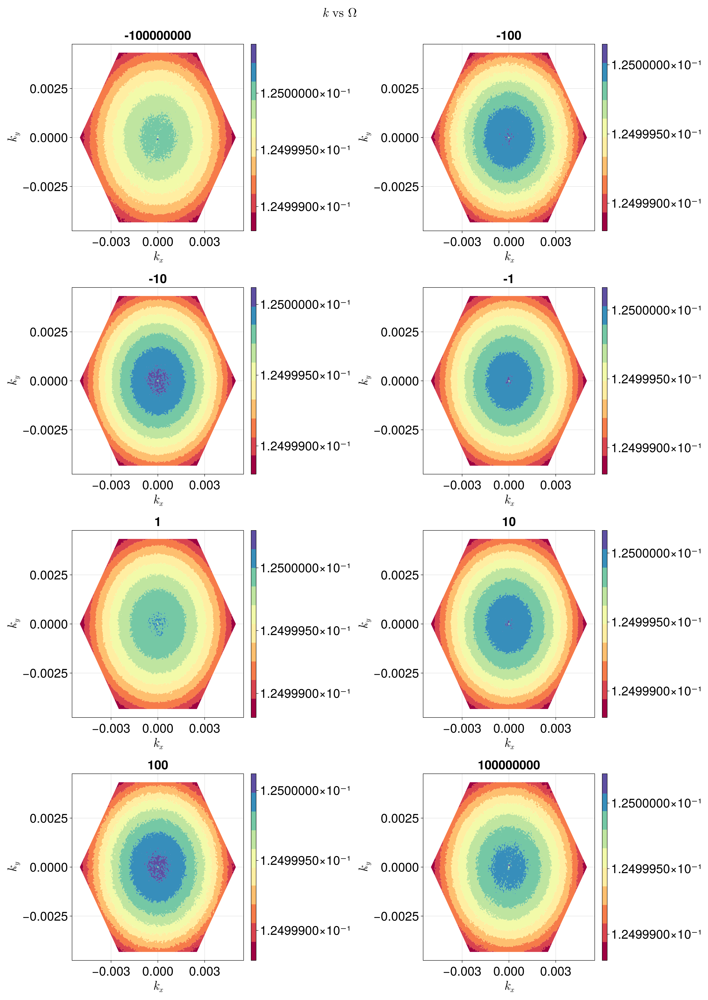

In [9]:
dirac_bc_contour_series(v, m, index, kappa, vF, delta, alpha_list, w, pd)

<font size="12">Decoupled BC</font>

In [10]:
# general parameters
pd = 80
kappa = 1
w = 10^(-2) * kappa
spacing = 0.5 * (w / 2 / pd)

2.5000000000000008e-5

In [11]:
# Dirac parameters
m = -1
v = 0.5
index = 1

1

In [12]:
# 3-patch parameters
delta = -1
vF = 0

0

In [13]:
alpha_list = (10) * [1, exp(pi/6 * im), exp(pi/3 * im), exp(pi/4 * im), exp(pi/2 * im), exp(2*pi/3 * im)]

6-element Vector{ComplexF64}:
                  10.0 + 0.0im
     8.660254037844387 + 4.999999999999999im
     5.000000000000001 + 8.660254037844386im
    7.0710678118654755 + 7.071067811865475im
 6.123233995736766e-16 + 10.0im
    -4.999999999999998 + 8.660254037844387im

In [14]:
function dirac_decoupled_comp(pd, w, spacing, v, m, index, kappa, vF, delta, alpha_list)

    grid_sor = make_hex([0, 0], w / 2, w / 2 / pd)

    grid_patch = make_hex([0, 0], w / 2, w / 2 / pd)

    fig = Figure(size=(2000, 800 * length(alpha_list)), fontsize=25)
    for j in 1:length(alpha_list)
        alpha = alpha_list[j]
        sor_bc = dirac_spinor_bc(grid_sor, spacing, v, m, index) .+ bc_no_spinors(grid_sor, spacing, vF, kappa, delta, alpha)[1]
        patch_bc = dirac_patch_bc(grid_patch, spacing, v, m, index, kappa, vF, delta, alpha)
        ax1 = Axis(fig[j, 1], title = string(angle(alpha) / pi), 
        xlabel = L"k_x", ylabel = L"k_y")
        tricontourf!(ax1, grid_patch[:, 1], grid_patch[:, 2], patch_bc, colormap = :Spectral)
        X, ax1, tr1 = tricontourf(grid_patch[:, 1], grid_patch[:, 2], patch_bc, colormap = :Spectral)
        cb1 = Colorbar(fig[j, 2], tr1)

        ax3 = Axis(fig[j, 3], title = string(angle(alpha) / pi)
        , xlabel = L"k_x", ylabel = L"k_y")
        tricontourf!(ax3, grid_sor[:, 1], grid_sor[:, 2], sor_bc, colormap = :Spectral)
        X, ax3, tr3 = tricontourf(grid_sor[:, 1], grid_sor[:, 2], sor_bc, colormap = :Spectral)
        cb3 = Colorbar(fig[j, 4], tr3)
    end
    ax_c1 = Axis(fig[:, 1], title = L"\text{3-Patch } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(ax_c1, label = false)
    hidespines!(ax_c1)

    ax_c2 = Axis(fig[:, 3], title = L"\text{Decoupled } \Omega (\textbf{k})", titlegap = 60)
    hidedecorations!(ax_c2, label = false)
    hidespines!(ax_c2)

    fig
end

dirac_decoupled_comp (generic function with 1 method)

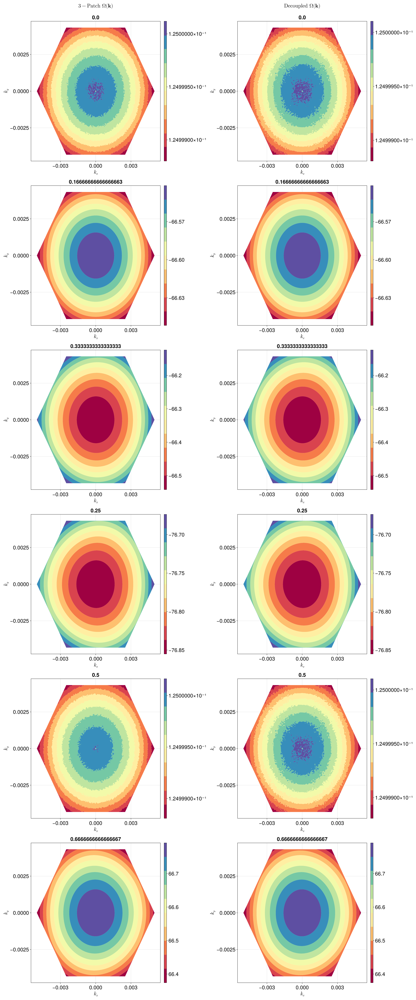

In [15]:
dirac_decoupled_comp(pd, w, spacing, v, m, index, kappa, vF, delta, alpha_list)

In [16]:
function dirac_bc_theta_series(v, m, l, kappa, vF, delta, alpha_list, w, p, pd)
    theta_list = range(0, 2*pi, 1000)
    curvature_ns = Array{Float64}(undef, length(theta_list))
    spacing = 0.5 * (w / 2 / pd)
    # create plot
    P = Figure(size=(3000, 2000), fontsize=30)
    for j in 1:length(alpha_list)
        alpha = alpha_list[j]
        for i in 1:length(theta_list)
            theta = theta_list[i]
            x = p * cos(theta)
            y = p * sin(theta)
            grid = reshape([x, y], (1, 2))
            curvature_ns[i] = dirac_patch_bc(grid, spacing, v, m, l, kappa, vF, delta, alpha)[1]
        end
        index = j % 3
        if j % 3 == 0
            index = 3
        end
        ax1 = Axis(P[Int(floor((j - 1) / 3)) + 1, index], title = string(imag(alpha)), xlabel = L"\theta", ylabel = L"\Omega")
        lines!(ax1, theta_list, curvature_ns)
    end
    ax = Axis(P[:, :], title = L"\theta \text{ vs } \Omega", titlegap = 60)
    hidedecorations!(ax, label = false)
    hidespines!(ax)
    P
end

dirac_bc_theta_series (generic function with 1 method)

In [17]:
# parameters
# alpha_list = (30) * [1, exp(pi/6 * im), exp(pi/3 * im), exp(pi/4 * im), exp(pi/2 * im), exp(2*pi/3 * im), exp(5*pi/6 * im), 
# exp(3*pi/4 * im), exp(pi * im), exp(4*pi/3 * im), exp(5*pi/3 * im), exp(3*pi/2 * im)]
alpha_list = exp(im * pi/2) * [0, 10, 10^6, 10^8, 10^12]
p = 10^(-10)

1.0e-10

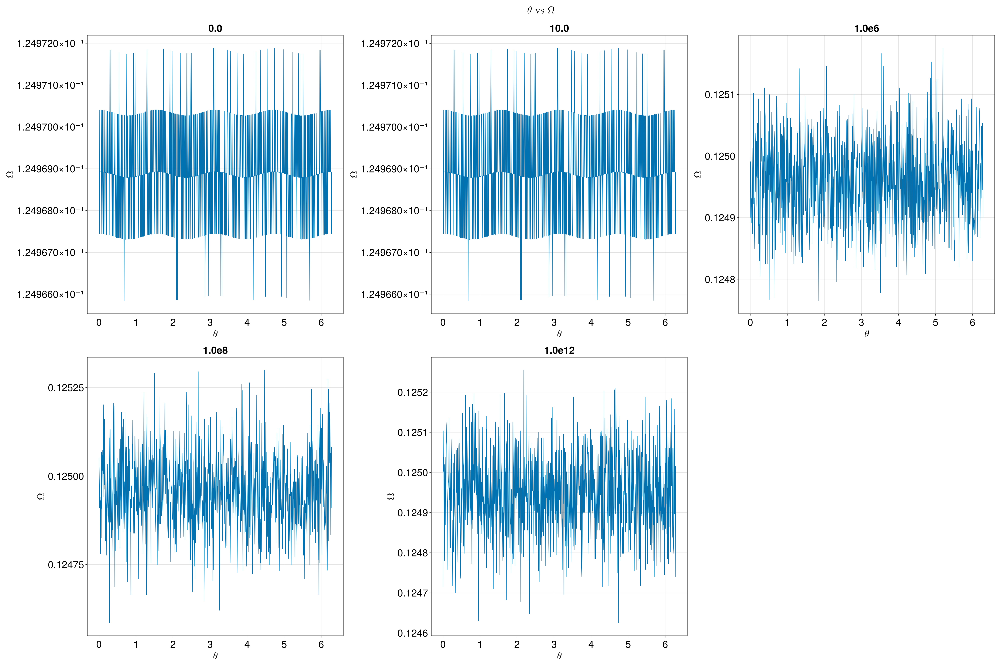

In [18]:
dirac_bc_theta_series(v, m, index, kappa, vF, delta, alpha_list, w, p, pd)